In [6]:
# pip install pandas numpy seaborn matplot

## Importando as bibliotecas

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## Importando os dataset

##### Alterem o diretório abaixo para o local onde estiver os seus dados (se estiver em sua máquina local)
##### Importante: o 'r' antes do diretório para saber que é uma "raw string"

In [8]:
#Importando preços 
url1 = 'https://drive.google.com/file/d/1WAbTdLmhm0Ih971SU3AY_RoXpfPJAMTi/view?usp=drive_link'
path1 = 'https://drive.google.com/uc?export=download&id='+url1.split('/')[-2]
df_price1 = pd.read_csv(path1)

url2 = 'https://drive.google.com/file/d/1J7oWaSGJVSiTl5TifTEgvbg0d08iSryf/view?usp=drive_link'
path2 = 'https://drive.google.com/uc?export=download&id='+url2.split('/')[-2]
df_price2 = pd.read_csv(path2)

url3 = 'https://drive.google.com/file/d/1qXDbN6ib9HO5oFbI3MtdvTfXP066hYZ6/view?usp=drive_link'
path3 = 'https://drive.google.com/uc?export=download&id='+url3.split('/')[-2]
df_price3 = pd.read_csv(path3)

url4 = 'https://drive.google.com/file/d/1tgdpfFtl1DVczTouPUDc5tLcAbh7SpWP/view?usp=drive_link'
path4 = 'https://drive.google.com/uc?export=download&id='+url4.split('/')[-2]
df_price4 = pd.read_csv(path4)

url5 = 'https://drive.google.com/file/d/1NxHF52tEXTqbglY-14_WpLsDEnYHBnuK/view?usp=drive_link'
path5 = 'https://drive.google.com/uc?export=download&id='+url5.split('/')[-2]
df_price5 = pd.read_csv(path5)

df_price = pd.concat([df_price1, df_price2, df_price3, df_price4, df_price5], ignore_index=True)

In [9]:
#Importando Vendas 
url1 = 'https://drive.google.com/file/d/1sKG9E753lvXJPB5l3RktNct71J-xh_8w/view?usp=drive_link'
path1 = 'https://drive.google.com/uc?export=download&id='+url1.split('/')[-2]
df_sales1 = pd.read_csv(path1)

url2 = 'https://drive.google.com/file/d/1u0A_yubzWjWTWLFVrm7asWs395BQ578E/view?usp=drive_link'
path2 = 'https://drive.google.com/uc?export=download&id='+url2.split('/')[-2]
df_sales2 = pd.read_csv(path2)

url3 = 'https://drive.google.com/file/d/1NlRLGEEeUxlPDpt2FgrVvjiT_y_jHluh/view?usp=drive_link'
path3 = 'https://drive.google.com/uc?export=download&id='+url3.split('/')[-2]
df_sales3 = pd.read_csv(path3)

url4 = 'https://drive.google.com/file/d/13gowR6492BQrfQvU5_kYE5xxF3gWum38/view?usp=drive_link'
path4 = 'https://drive.google.com/uc?export=download&id='+url4.split('/')[-2]
df_sales4 = pd.read_csv(path4)

url5 = 'https://drive.google.com/file/d/1FsYLisvlMXxMz6BeUu1-1iuumVaYb9J-/view?usp=drive_link'
path5 = 'https://drive.google.com/uc?export=download&id='+url5.split('/')[-2]
df_sales5 = pd.read_csv(path5)

url6 = 'https://drive.google.com/file/d/14AbgBUnbixFjv_8pPlUkchxFQ4kytgsb/view?usp=drive_link'
path6 = 'https://drive.google.com/uc?export=download&id='+url6.split('/')[-2]
df_sales6 = pd.read_csv(path6)

df_sales = pd.concat([df_sales1, df_sales2, df_sales3, df_sales4, df_sales5, df_sales6], ignore_index=True)

In [10]:
# df_events = pd.read_csv('daily_calendar_with_events.csv')

# Importando eventos
url = 'https://drive.google.com/file/d/1h94avu15TuiguEiwdKhzL06EBNkcmSjv/view?usp=drive_link'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
df_events = pd.read_csv(path)

#### Tratando o preço para ficar em semana

In [11]:
df_price.head()


,item,category,store_code,yearweek,sell_price
0,ACCESORIES_1_001,ACCESORIES,NYC_1,201328.0,12.7414
1,ACCESORIES_1_001,ACCESORIES,NYC_1,201329.0,12.7414
2,ACCESORIES_1_001,ACCESORIES,NYC_1,201330.0,10.9858
3,ACCESORIES_1_001,ACCESORIES,NYC_1,201331.0,10.9858
4,ACCESORIES_1_001,ACCESORIES,NYC_1,201332.0,10.9858


In [12]:
# Conferindo se a quantidade de semanas no df_price bate com a quantidade de dias no df_sales
distinct_yearweek=len(pd.unique(df_price['yearweek']))
print(distinct_yearweek)
print(1913/distinct_yearweek)

280
6.832142857142857


In [13]:
#Retira onde Yearweek for NaN (isso depois pode ser ajustado depois usando a média)
df_price_no_nan = df_price.dropna(subset=['yearweek'])
# Converter a coluna para string para facilitar a separação
df_price_no_nan['yearweek_char'] = df_price_no_nan['yearweek'].astype(str)

# Separar ano e semana
df_price_no_nan['year'] = df_price_no_nan['yearweek_char'].str[:4].astype(int)
df_price_no_nan['week'] = df_price_no_nan['yearweek_char'].str[4:6].astype(int)

df_price_no_nan

C:\Users\ermura\AppData\Local\Temp\ipykernel_17664\916990719.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_price_no_nan['yearweek_char'] = df_price_no_nan['yearweek'].astype(str)
C:\Users\ermura\AppData\Local\Temp\ipykernel_17664\916990719.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_price_no_nan['year'] = df_price_no_nan['yearweek_char'].str[:4].astype(int)
C:\Users\ermura\AppData\Local\Temp\ipykernel_17664\916990719.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of

,item,category,store_code,yearweek,sell_price,yearweek_char,year,week
0,ACCESORIES_1_001,ACCESORIES,NYC_1,201328.0,12.7414,201328.0,2013,28
1,ACCESORIES_1_001,ACCESORIES,NYC_1,201329.0,12.7414,201329.0,2013,29
2,ACCESORIES_1_001,ACCESORIES,NYC_1,201330.0,10.9858,201330.0,2013,30
3,ACCESORIES_1_001,ACCESORIES,NYC_1,201331.0,10.9858,201331.0,2013,31
4,ACCESORIES_1_001,ACCESORIES,NYC_1,201332.0,10.9858,201332.0,2013,32
...,...,...,...,...,...,...,...,...
6965693,SUPERMARKET_3_827,SUPERMARKET,PHI_3,201613.0,1.2000,201613.0,2016,13
6965694,SUPERMARKET_3_827,SUPERMARKET,PHI_3,201614.0,1.2000,201614.0,2016,14
6965695,SUPERMARKET_3_827,SUPERMARKET,PHI_3,201615.0,1.2000,201615.0,2016,15
6965696,SUPERMARKET_3_827,SUPERMARKET,PHI_3,201616.0,1.2000,201616.0,2016,16


In [14]:
df_price_no_nan.sort_values(by='week')

,item,category,store_code,yearweek,sell_price,yearweek_char,year,week
6254236,SUPERMARKET_3_816,SUPERMARKET,PHI_2,201500.0,0.2400,201500.0,2015,0
1862397,SUPERMARKET_2_337,SUPERMARKET,NYC_3,201300.0,7.5360,201300.0,2013,0
388181,SUPERMARKET_1_051,SUPERMARKET,NYC_1,201600.0,4.6440,201600.0,2016,0
1226575,SUPERMARKET_3_217,SUPERMARKET,NYC_2,201300.0,3.5760,201300.0,2013,0
4128371,SUPERMARKET_3_579,SUPERMARKET,BOS_2,201600.0,2.3760,201600.0,2016,0
...,...,...,...,...,...,...,...,...
2943180,HOME_&_GARDEN_1_241,HOME_&_GARDEN,BOS_1,201253.0,9.9250,201253.0,2012,53
6449941,HOME_&_GARDEN_1_279,HOME_&_GARDEN,PHI_3,201253.0,1.2125,201253.0,2012,53
361157,HOME_&_GARDEN_2_457,HOME_&_GARDEN,NYC_1,201253.0,8.0875,201253.0,2012,53
3834370,HOME_&_GARDEN_2_466,HOME_&_GARDEN,BOS_2,201253.0,8.7125,201253.0,2012,53


In [114]:
#Retirando colunas que não são mais necessárias
df_price_clean = df_price_no_nan.drop(columns=['yearweek','yearweek_char'])
df_price_clean

,item,category,store_code,sell_price,yearweek_char,year,week
0,ACCESORIES_1_001,ACCESORIES,NYC_1,12.7414,201328.0,2013,28
1,ACCESORIES_1_001,ACCESORIES,NYC_1,12.7414,201329.0,2013,29
2,ACCESORIES_1_001,ACCESORIES,NYC_1,10.9858,201330.0,2013,30
3,ACCESORIES_1_001,ACCESORIES,NYC_1,10.9858,201331.0,2013,31
4,ACCESORIES_1_001,ACCESORIES,NYC_1,10.9858,201332.0,2013,32
...,...,...,...,...,...,...,...
6965693,SUPERMARKET_3_827,SUPERMARKET,PHI_3,1.2000,201613.0,2016,13
6965694,SUPERMARKET_3_827,SUPERMARKET,PHI_3,1.2000,201614.0,2016,14
6965695,SUPERMARKET_3_827,SUPERMARKET,PHI_3,1.2000,201615.0,2016,15
6965696,SUPERMARKET_3_827,SUPERMARKET,PHI_3,1.2000,201616.0,2016,16


In [115]:
#Precos medios por produto. Podemos juntar com o dataset sales depois
df_mean_prices = pd.DataFrame(df_price.groupby(['item','store_code'])['sell_price'].mean().reset_index())
df_mean_prices.rename(columns={'sell_price':'sell_price_mean'}, inplace=True)
df_mean_prices

,item,store_code,sell_price_mean
0,ACCESORIES_1_001,BOS_1,10.969366
1,ACCESORIES_1_001,BOS_2,10.997126
2,ACCESORIES_1_001,BOS_3,11.072293
3,ACCESORIES_1_001,NYC_1,11.019346
4,ACCESORIES_1_001,NYC_2,10.997126
...,...,...,...
30485,SUPERMARKET_3_827,NYC_3,1.200000
30486,SUPERMARKET_3_827,NYC_4,1.200000
30487,SUPERMARKET_3_827,PHI_1,1.200000
30488,SUPERMARKET_3_827,PHI_2,1.200000


In [116]:
#Renomeando a coluna d para days do df_events
df_events.rename(columns={'d':'day'}, inplace=True)
#Mudando o tipo da coluna date de objeto para data
df_events['date'] = pd.to_datetime(df_events['date'], format='%Y-%m-%d')
print(df_events.columns)

Index(['date', 'weekday', 'weekday_int', 'day', 'event'], dtype='object')


In [117]:
#Transpose da df_sales para que colunas virem linhas
sales_melted = df_sales.melt(id_vars=['id', 'item', 'category', 'department', 'store', 'store_code', 'region'], var_name='day', value_name='units_sold')
sales_melted

,id,item,category,department,store,store_code,region,day,units_sold
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
1,ACCESORIES_1_002_NYC_1,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
2,ACCESORIES_1_003_NYC_1,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
3,ACCESORIES_1_004_NYC_1,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
4,ACCESORIES_1_005_NYC_1,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
...,...,...,...,...,...,...,...,...,...
58327365,SUPERMARKET_3_823_PHI_3,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1
58327366,SUPERMARKET_3_824_PHI_3,SUPERMARKET_3_824,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0
58327367,SUPERMARKET_3_825_PHI_3,SUPERMARKET_3_825,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0
58327368,SUPERMARKET_3_826_PHI_3,SUPERMARKET_3_826,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,3


In [118]:
#merge entre sales e events
df_sales_daily = sales_melted.merge(df_events, how='left', on='day')
df_sales_daily['year'] = df_sales_daily['date'].dt.year
df_sales_daily['week'] = df_sales_daily['date'].dt.isocalendar().week

In [119]:
#merge entre df anterior e mean_prices
df_01 = df_sales_daily.merge(df_price_clean, how='left', on=['item','store_code','year','week'])
df = df_01.merge(df_mean_prices, how='left', on=['item','store_code'])
df.head(10)

KeyboardInterrupt: 

In [21]:
#Verificando o shape antes e depois
print(df_sales_daily.shape)
print(df_01.shape)
print(df.shape)

(58327370, 15)
(58327370, 17)
(58327370, 18)


In [22]:
#Se o sell_price for NaN, repor pela média
df['sell_price'].fillna(df['sell_price_mean'], inplace=True)
df.drop(columns=['sell_price_mean'], inplace=True)
df

C:\Users\ermura\AppData\Local\Temp\ipykernel_17664\673401096.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['sell_price'].fillna(df['sell_price_mean'], inplace=True)


,id,item,category_x,department,store,store_code,region,day,units_sold,date,weekday,weekday_int,event,year,week,category_y,sell_price
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,NaN,2011,4,NaN,11.019346
1,ACCESORIES_1_002_NYC_1,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,NaN,2011,4,NaN,5.280100
2,ACCESORIES_1_003_NYC_1,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,NaN,2011,4,NaN,3.950100
3,ACCESORIES_1_004_NYC_1,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,NaN,2011,4,NaN,6.022636
4,ACCESORIES_1_005_NYC_1,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,NaN,2011,4,NaN,3.909906
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58327365,SUPERMARKET_3_823_PHI_3,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,3.576000
58327366,SUPERMARKET_3_824_PHI_3,SUPERMARKET_3_824,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,2.976000
58327367,SUPERMARKET_3_825_PHI_3,SUPERMARKET_3_825,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,4.776000
58327368,SUPERMARKET_3_826_PHI_3,SUPERMARKET_3_826,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,3,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,1.536000


In [23]:
#criando uma coluna com o total sale por item diaraimente
df['total_sale'] = df['units_sold'] * df['sell_price']
df

,id,item,category_x,department,store,store_code,region,day,units_sold,date,weekday,weekday_int,event,year,week,category_y,sell_price,total_sale
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,NaN,2011,4,NaN,11.019346,0.000
1,ACCESORIES_1_002_NYC_1,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,NaN,2011,4,NaN,5.280100,0.000
2,ACCESORIES_1_003_NYC_1,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,NaN,2011,4,NaN,3.950100,0.000
3,ACCESORIES_1_004_NYC_1,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,NaN,2011,4,NaN,6.022636,0.000
4,ACCESORIES_1_005_NYC_1,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,NaN,2011,4,NaN,3.909906,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58327365,SUPERMARKET_3_823_PHI_3,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,3.576000,3.576
58327366,SUPERMARKET_3_824_PHI_3,SUPERMARKET_3_824,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,2.976000,0.000
58327367,SUPERMARKET_3_825_PHI_3,SUPERMARKET_3_825,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,4.776000,0.000
58327368,SUPERMARKET_3_826_PHI_3,SUPERMARKET_3_826,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,3,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,1.536000,4.608


In [24]:
#Retirando onde units_sold = 'NaN' para reduzir o tempo de processamento das agregações
df_remove_0 = df.loc[df['units_sold'] != 0]
print(df_remove_0.shape)
df_remove_0

(18550276, 18)


,id,item,category_x,department,store,store_code,region,day,units_sold,date,weekday,weekday_int,event,year,week,category_y,sell_price,total_sale
7,ACCESORIES_1_008_NYC_1,ACCESORIES_1_008,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,12,2011-01-29,Saturday,1,NaN,2011,4,NaN,0.633580,7.602966
8,ACCESORIES_1_009_NYC_1,ACCESORIES_1_009,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,2,2011-01-29,Saturday,1,NaN,2011,4,NaN,2.347288,4.694576
14,ACCESORIES_1_015_NYC_1,ACCESORIES_1_015,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,4,2011-01-29,Saturday,1,NaN,2011,4,NaN,0.939712,3.758849
15,ACCESORIES_1_016_NYC_1,ACCESORIES_1_016,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,5,2011-01-29,Saturday,1,NaN,2011,4,NaN,0.939712,4.698561
21,ACCESORIES_1_022_NYC_1,ACCESORIES_1_022,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,2,2011-01-29,Saturday,1,NaN,2011,4,NaN,9.499722,18.999444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58327361,SUPERMARKET_3_819_PHI_3,SUPERMARKET_3_819,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,2,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,2.376000,4.752000
58327362,SUPERMARKET_3_820_PHI_3,SUPERMARKET_3_820,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,2.376000,2.376000
58327364,SUPERMARKET_3_822_PHI_3,SUPERMARKET_3_822,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,4.776000,4.776000
58327365,SUPERMARKET_3_823_PHI_3,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,3.576000,3.576000


In [25]:
#### Preços Médios ####
#Precos medios por produto
df_item_price = pd.DataFrame(df_price_clean.groupby(['item'])['sell_price'].mean().reset_index())
df_item_price.rename(columns={'sell_price': 'mean_sell_price'}, inplace=True)
#Precos médios por produto x semana
df_item_x_week = pd.DataFrame(df_price_clean.groupby(['item','week'])['sell_price'].mean().reset_index())
#Merge com o dataframe anterior e calculando a % de diferença
df_item_price_compare = pd.merge(df_item_price, df_item_x_week, on='item')
df_item_price_compare['sell_price_diff'] = df_item_price_compare['sell_price']/df_item_price_compare['mean_sell_price']
print(df_item_price_compare)

#Precos medios por loja
df_store_price = pd.DataFrame(df_price_clean.groupby(['store_code'])['sell_price'].mean().reset_index())
df_store_price.rename(columns={'sell_price': 'mean_sell_price'}, inplace=True)
#Precos médios por loja x semana
df_store_x_week = pd.DataFrame(df_price_clean.groupby(['store_code','week'])['sell_price'].mean().reset_index())
#Merge com o dataframe anterior e calculando a % de diferença
df_store_price_compare = pd.merge(df_store_price, df_store_x_week, on='store_code')
df_store_price_compare['sell_price_diff'] = df_store_price_compare['sell_price']/df_store_price_compare['mean_sell_price']
print(df_store_price_compare)


#### Agrupamentos ####
#Venda por produto x semana
df_sold_item_x_week = pd.DataFrame(df_remove_0.groupby(['item','week'])['units_sold'].sum().reset_index())
print(df_sold_item_x_week.shape)

#Venda por loja x semana
df_sold_store_x_week = pd.DataFrame(df_remove_0.groupby(['store_code','week'])['units_sold'].sum().reset_index())
print(df_sold_store_x_week.shape)

#Venda e preço médio por loja e produto
df_sold_store_x_item = df_remove_0.groupby(['store_code', 'item']).agg({'units_sold': 'sum','sell_price': 'mean'}).reset_index()
print(df_sold_store_x_item.shape)

                     item  mean_sell_price  week  sell_price  sell_price_diff
0        ACCESORIES_1_001        11.032755     0    11.01772         0.998637
1        ACCESORIES_1_001        11.032755     1    11.01772         0.998637
2        ACCESORIES_1_001        11.032755     2    11.01772         0.998637
3        ACCESORIES_1_001        11.032755     3    11.01772         0.998637
4        ACCESORIES_1_001        11.032755     4    11.01772         0.998637
...                   ...              ...   ...         ...              ...
163901  SUPERMARKET_3_827         1.199395    48     1.20000         1.000505
163902  SUPERMARKET_3_827         1.199395    49     1.20000         1.000505
163903  SUPERMARKET_3_827         1.199395    50     1.20000         1.000505
163904  SUPERMARKET_3_827         1.199395    51     1.20000         1.000505
163905  SUPERMARKET_3_827         1.199395    52     1.20000         1.000505

[163906 rows x 5 columns]
    store_code  mean_sell_price  week

In [26]:
#Venda e preço médio por loja e produto
df_sold_store_x_item = df_remove_0.groupby(['store_code', 'department']).agg({
    'units_sold': 'sum',
    'sell_price': 'mean'
    }).reset_index()
print(df_sold_store_x_item)

   store_code       department  units_sold  sell_price
0       BOS_1     ACCESORIES_1      386024    7.396616
1       BOS_1     ACCESORIES_2       43060    3.357846
2       BOS_1  HOME_&_GARDEN_1     1145836    5.607286
3       BOS_1  HOME_&_GARDEN_2      242163    6.448428
4       BOS_1    SUPERMARKET_1      365656    3.612285
..        ...              ...         ...         ...
65      PHI_3  HOME_&_GARDEN_1     1017626    5.505616
66      PHI_3  HOME_&_GARDEN_2      212808    6.210954
67      PHI_3    SUPERMARKET_1      398825    3.456651
68      PHI_3    SUPERMARKET_2      811498    4.486642
69      PHI_3    SUPERMARKET_3     3520357    3.178846

[70 rows x 4 columns]


In [27]:
df_sold_week_x_depart = df_remove_0.groupby(['department','week']).agg({
    'units_sold': 'sum',
    'total_sale': 'sum',
    'sell_price': 'mean'
    }).reset_index()

# from sklearn.preprocessing import LabelEncoder
# le = LabelEncoder()
# df_sold_store_x_item_enc['item']= le.fit_transform(df_sold_store_x_item_enc['item'])
# df_sold_store_x_item_enc['store_code']= le.fit_transform(df_sold_store_x_item_enc['store_code'])

df_sold_week_x_depart

,department,week,units_sold,total_sale,sell_price
0,ACCESORIES_1,1,102351,5.541565e+05,7.730823
1,ACCESORIES_1,2,96219,5.284270e+05,7.765051
2,ACCESORIES_1,3,97859,5.369615e+05,7.741594
3,ACCESORIES_1,4,111617,5.679967e+05,7.459462
4,ACCESORIES_1,5,128337,6.353821e+05,7.466978
...,...,...,...,...,...
366,SUPERMARKET_3,49,592804,1.564859e+06,3.268888
367,SUPERMARKET_3,50,578595,1.560683e+06,3.298566
368,SUPERMARKET_3,51,548463,1.497552e+06,3.302563
369,SUPERMARKET_3,52,486260,1.297455e+06,3.251548


In [28]:
df_sold_week_x_store = df_remove_0.groupby(['item']).agg({
    'units_sold': 'sum',
    'total_sale': 'sum',
    'sell_price': 'mean'
    }).reset_index()

# from sklearn.preprocessing import LabelEncoder
# le = LabelEncoder()
# df_sold_store_x_item_enc['item']= le.fit_transform(df_sold_store_x_item_enc['item'])
# df_sold_store_x_item_enc['store_code']= le.fit_transform(df_sold_store_x_item_enc['store_code'])

df_sold_week_x_store

,item,units_sold,total_sale,sell_price
0,ACCESORIES_1_001,4093,45022.744368,11.001805
1,ACCESORIES_1_002,5059,26702.798303,5.277776
2,ACCESORIES_1_003,1435,5652.256656,3.943266
3,ACCESORIES_1_004,39175,235359.480395,5.990894
4,ACCESORIES_1_005,14621,55665.118681,3.820442
...,...,...,...,...
3044,SUPERMARKET_3_823,15388,50901.044988,3.319614
3045,SUPERMARKET_3_824,8325,25412.784878,3.037876
3046,SUPERMARKET_3_825,13526,65806.485183,4.872210
3047,SUPERMARKET_3_826,12188,18719.750118,1.535882


#### EDA

In [29]:
from src.heatmap import heatmap

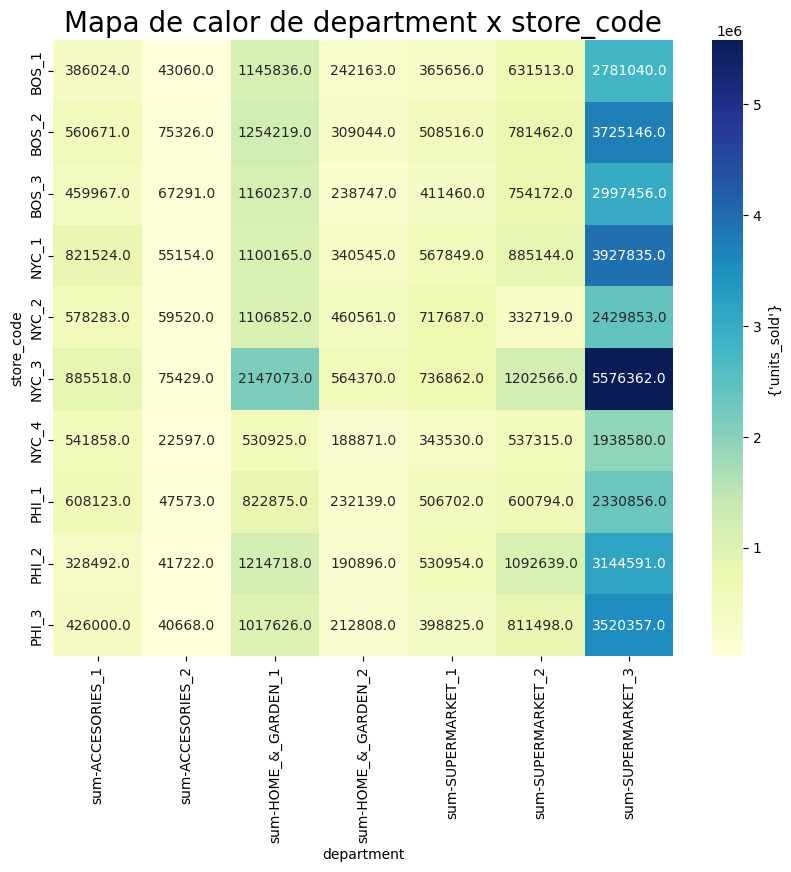

In [30]:
heatmap(df_var=df_remove_0, x_var='department', y_var='store_code', target='units_sold',agg='sum')

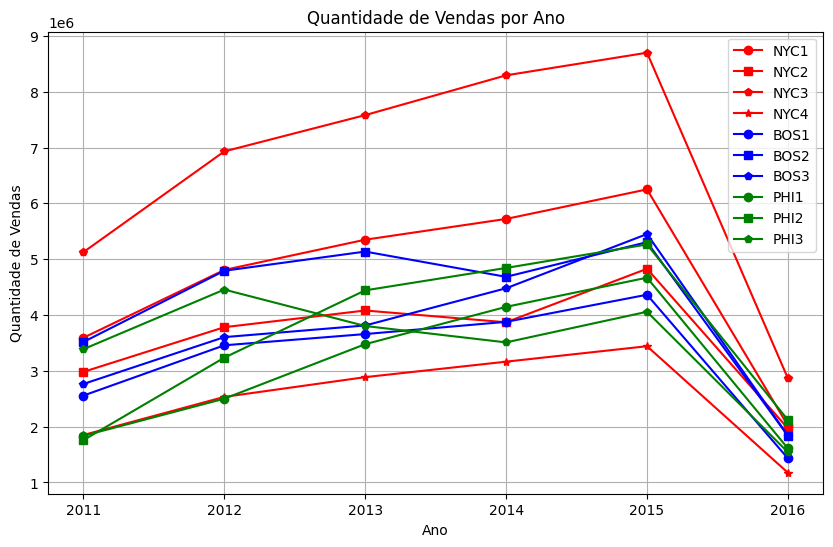

In [31]:
#Receita por cada loja anual
df_anual_store_revenue = df_remove_0.groupby(['year', 'store_code']).agg({
    'total_sale': 'sum'
    }).reset_index()
# print(df_anual_store_revenue)

#Segmentando por loja
nyc1 = df_anual_store_revenue[df_anual_store_revenue['store_code'] == 'NYC_1']
nyc2 = df_anual_store_revenue[df_anual_store_revenue['store_code'] == 'NYC_2']
nyc3 = df_anual_store_revenue[df_anual_store_revenue['store_code'] == 'NYC_3']
nyc4 = df_anual_store_revenue[df_anual_store_revenue['store_code'] == 'NYC_4']
bos1 = df_anual_store_revenue[df_anual_store_revenue['store_code'] == 'BOS_1']
bos2 = df_anual_store_revenue[df_anual_store_revenue['store_code'] == 'BOS_2']
bos3 = df_anual_store_revenue[df_anual_store_revenue['store_code'] == 'BOS_3']
phi1 = df_anual_store_revenue[df_anual_store_revenue['store_code'] == 'PHI_1']
phi2 = df_anual_store_revenue[df_anual_store_revenue['store_code'] == 'PHI_2']
phi3 = df_anual_store_revenue[df_anual_store_revenue['store_code'] == 'PHI_3']


# Criando o gráfico de linha
plt.figure(figsize=(10, 6))
plt.plot(nyc1['year'], nyc1['total_sale'], marker='o', label='NYC1', color='r')
plt.plot(nyc2['year'], nyc2['total_sale'], marker='s', label='NYC2', color='r')
plt.plot(nyc3['year'], nyc3['total_sale'], marker='p', label='NYC3', color='r')
plt.plot(nyc4['year'], nyc4['total_sale'], marker='*', label='NYC4', color='r')
plt.plot(bos1['year'], bos1['total_sale'], marker='o', label='BOS1', color='b')
plt.plot(bos2['year'], bos2['total_sale'], marker='s', label='BOS2', color='b')
plt.plot(bos3['year'], bos3['total_sale'], marker='p', label='BOS3', color='b')
plt.plot(phi1['year'], phi1['total_sale'], marker='o', label='PHI1', color='g')
plt.plot(phi2['year'], phi2['total_sale'], marker='s', label='PHI2', color='g')
plt.plot(phi3['year'], phi3['total_sale'], marker='p', label='PHI3', color='g')

# Adicionando títulos e legendas
plt.title('Quantidade de Vendas por Ano')
plt.xlabel('Ano')
plt.ylabel('Quantidade de Vendas')
plt.legend()
plt.grid(True)
plt.show()

C:\Users\ermura\AppData\Local\Temp\ipykernel_17664\3657015814.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_remove_0['month'] = df_remove_0['date'].dt.month


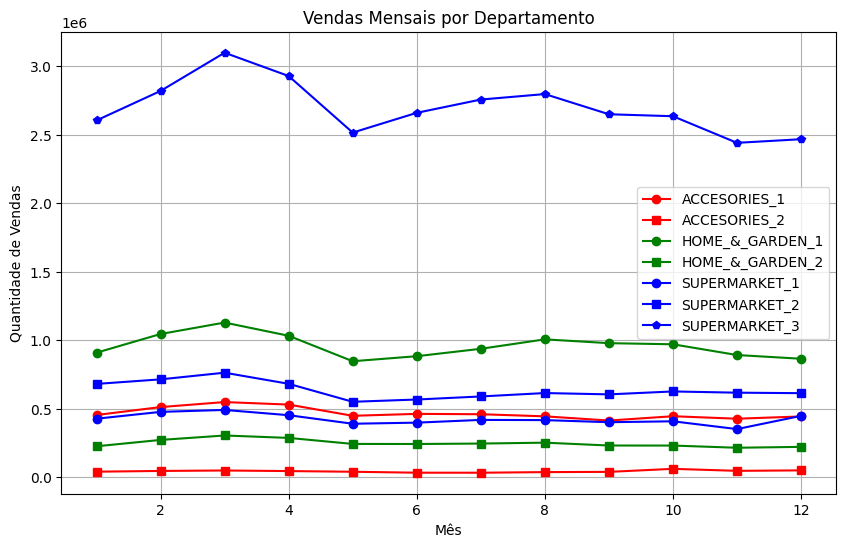

In [32]:
# Extraindo o mês
df_remove_0['month'] = df_remove_0['date'].dt.month
#Receita por cada loja anual
df_month_sales_depart = df_remove_0.groupby(['month', 'department']).agg({
    'units_sold': 'sum'
    }).reset_index()
# print(df_anual_revenue)


ACCESORIES_1 = df_month_sales_depart[df_month_sales_depart['department'] == 'ACCESORIES_1']
ACCESORIES_2 = df_month_sales_depart[df_month_sales_depart['department'] == 'ACCESORIES_2']
HOME_GARDEN_1 = df_month_sales_depart[df_month_sales_depart['department'] == 'HOME_&_GARDEN_1']
HOME_GARDEN_2 = df_month_sales_depart[df_month_sales_depart['department'] == 'HOME_&_GARDEN_2']
SUPERMARKET_1 = df_month_sales_depart[df_month_sales_depart['department'] == 'SUPERMARKET_1']
SUPERMARKET_2 = df_month_sales_depart[df_month_sales_depart['department'] == 'SUPERMARKET_2']
SUPERMARKET_3 = df_month_sales_depart[df_month_sales_depart['department'] == 'SUPERMARKET_3']

# Criando o gráfico de linha
plt.figure(figsize=(10, 6))
plt.plot(ACCESORIES_1['month'], ACCESORIES_1['units_sold'], marker='o', label='ACCESORIES_1', color='r')
plt.plot(ACCESORIES_2['month'], ACCESORIES_2['units_sold'], marker='s', label='ACCESORIES_2', color='r')
plt.plot(HOME_GARDEN_1['month'], HOME_GARDEN_1['units_sold'], marker='o', label='HOME_&_GARDEN_1', color='g')
plt.plot(HOME_GARDEN_2['month'], HOME_GARDEN_2['units_sold'], marker='s', label='HOME_&_GARDEN_2', color='g')
plt.plot(SUPERMARKET_1['month'], SUPERMARKET_1['units_sold'], marker='o', label='SUPERMARKET_1', color='b')
plt.plot(SUPERMARKET_2['month'], SUPERMARKET_2['units_sold'], marker='s', label='SUPERMARKET_2', color='b')
plt.plot(SUPERMARKET_3['month'], SUPERMARKET_3['units_sold'], marker='p', label='SUPERMARKET_3', color='b')


# Adicionando títulos e legendas
plt.title('Vendas Mensais por Departamento')
plt.xlabel('Mês')
plt.ylabel('Quantidade de Vendas')
plt.legend()
plt.grid(True)
plt.show()

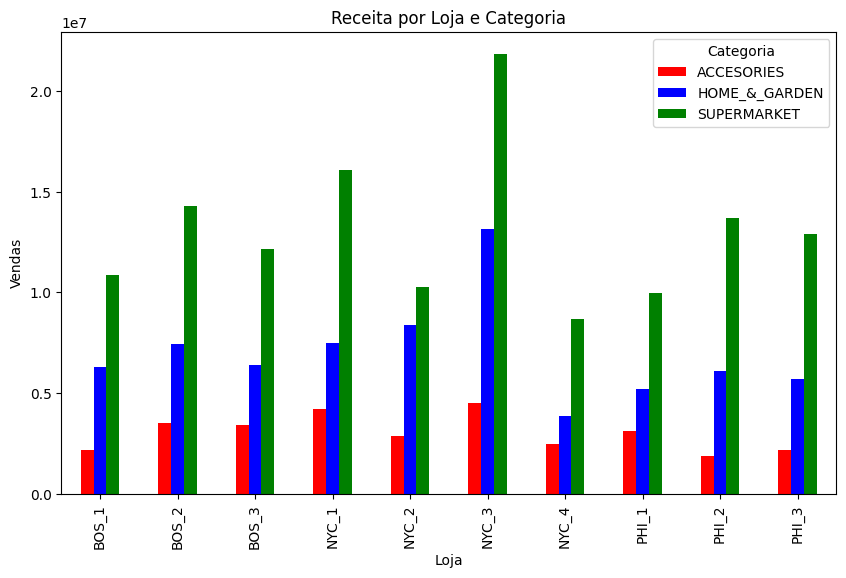

In [33]:
#Receita por cada loja x categoria
df_cat_x_loja = df_remove_0.groupby(['category_x', 'store_code']).agg({
    'total_sale': 'sum'
    }).reset_index()

# Pivotando o dataframe para facilitar o plot
pivot_df_cat_x_loja = df_cat_x_loja.pivot(index='store_code', columns='category_x', values='total_sale')

# Configurando o gráfico de barras agrupadas
pivot_df_cat_x_loja.plot(kind='bar', figsize=(10, 6), color=['r','b','g'])

# Adicionando títulos e legendas
plt.title('Receita por Loja e Categoria')
plt.xlabel('Loja')
plt.ylabel('Vendas')
plt.legend(title='Categoria')

# plt.grid(True)
plt.show()

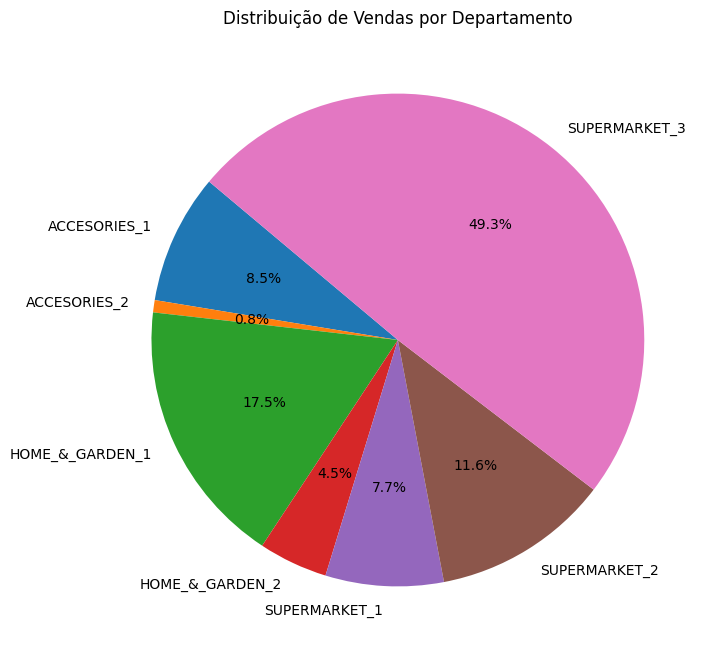

In [34]:
#Categoria x Departamento
df_depart_x_cat= df_remove_0.groupby(['category_x', 'department']).agg({
    'units_sold': 'sum'
    }).reset_index()

# ACCESORIES = df_depart_x_cat[df_depart_x_cat['category_x'] == 'ACCESORIES']
# HOME_GARDEN = df_depart_x_cat[df_depart_x_cat['category_x'] == 'HOME_&_GARDEN']
# SUPERMARKET = df_depart_x_cat[df_depart_x_cat['category_x'] == 'SUPERMARKET']

# Criando o gráfico de pizza
plt.figure(figsize=(8, 8))
plt.pie(df_depart_x_cat['units_sold'], labels=df_depart_x_cat['department'], autopct='%1.1f%%', startangle=140)

# Adicionando título
plt.title('Distribuição de Vendas por Departamento')
plt.show()

#### Lojas Semelhantes

https://www.kaggle.com/code/vineetverma/product-grouping-based-on-customer-behaviour
https://datascience.stackexchange.com/questions/113369/how-to-group-products-that-are-similar-and-bought-together-over-a-short-time-win
https://stats.stackexchange.com/questions/267879/finding-similar-groups-in-data

C:\Users\ermura\AppData\Local\Temp\ipykernel_17664\638751589.py:17: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linked = linkage(distance_matrix, 'single')


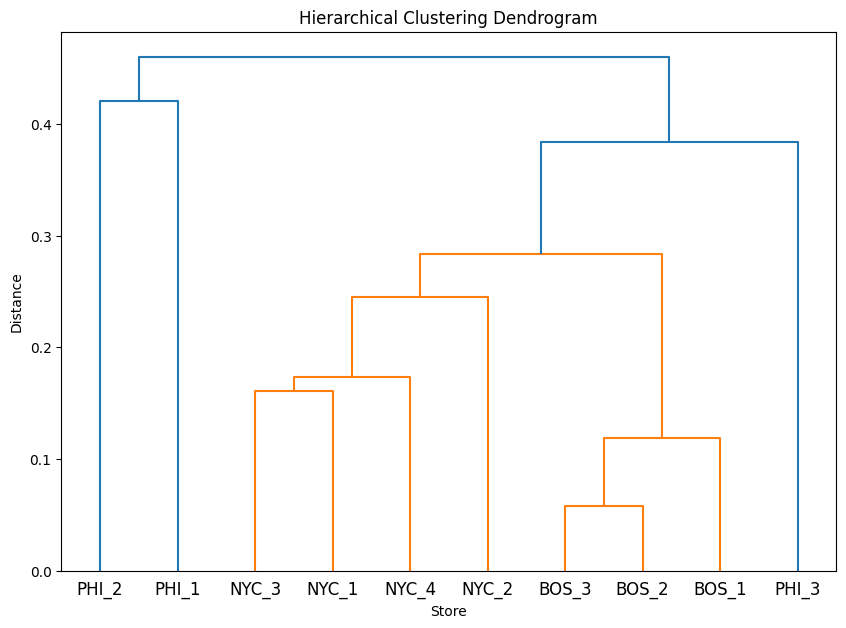

In [35]:
from scipy.cluster.hierarchy import linkage, dendrogram
# Criando a matriz binária
df_item_x_store_code= df_remove_0.groupby(['item', 'store_code']).agg({
    'units_sold': 'sum'
    }).reset_index()

# Criando a matriz de vendas
sales_matrix = pd.pivot_table(df_item_x_store_code, values='units_sold', index='store_code', columns='item', fill_value=0)

# Calculando a matriz de similaridade usando correlação de Pearson
similarity_matrix = sales_matrix.T.corr()

# Convertendo a matriz de similaridade para uma matriz de distância
distance_matrix = 1 - similarity_matrix

# Realizando o clustering hierárquico
linked = linkage(distance_matrix, 'single')

# Plotando o dendrograma
plt.figure(figsize=(10, 7))
dendrogram(linked, labels=sales_matrix.index, distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Store')
plt.ylabel('Distance')
plt.show()


C:\Users\ermura\AppData\Local\Temp\ipykernel_17664\478172185.py:17: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linked = linkage(distance_matrix, 'single')


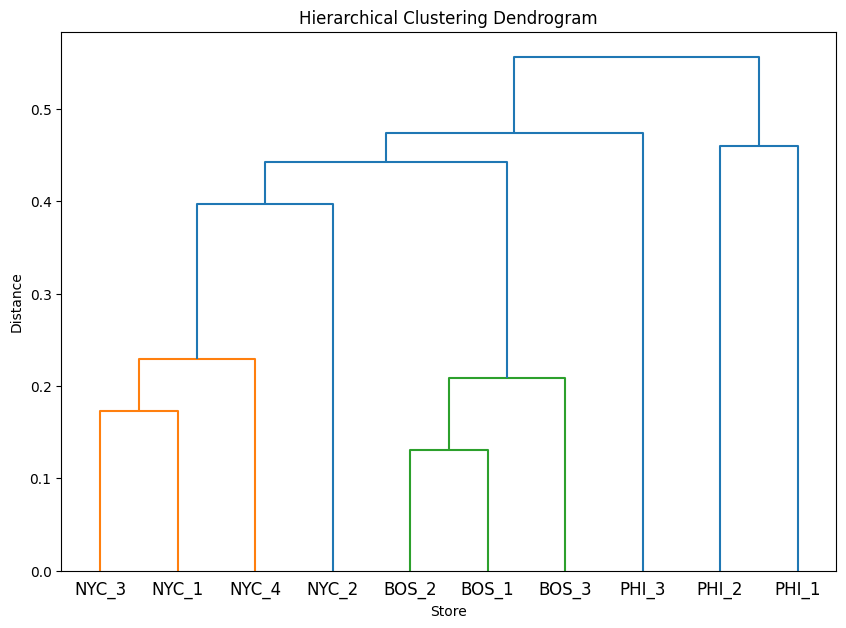

In [36]:
from scipy.cluster.hierarchy import linkage, dendrogram
# Criando a matriz binária
df_item_x_store_code= df_remove_0.groupby(['item', 'store_code']).agg({
    'total_sale': 'sum'
    }).reset_index()

# Criando a matriz de vendas
sales_matrix = pd.pivot_table(df_item_x_store_code, values='total_sale', index='store_code', columns='item', fill_value=0)

# Calculando a matriz de similaridade usando correlação de Pearson
similarity_matrix = sales_matrix.T.corr()

# Convertendo a matriz de similaridade para uma matriz de distância
distance_matrix = 1 - similarity_matrix

# Realizando o clustering hierárquico
linked = linkage(distance_matrix, 'single')

# Plotando o dendrograma
plt.figure(figsize=(10, 7))
dendrogram(linked, labels=sales_matrix.index, distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Store')
plt.ylabel('Distance')
plt.show()


In [37]:
# Clusterizando semelhança de produto 
from sklearn.preprocessing import StandardScaler
# Pivotar a tabela para ter produtos como colunas e datas como linhas
df_pivot = df_remove_0.pivot_table(index='week', columns='item', values='units_sold',aggfunc='sum').fillna(0)
df_pivot.head()
# print(df_pivot.head())

scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_pivot)
df_scaled



array([[ 0.30218542, -0.62462594, -0.7171846 , ..., -0.40288475,
        -0.25963523, -0.16389225],
       [ 0.66856054, -0.96819336, -0.45075387, ..., -0.12384128,
         0.5434321 ,  0.21152114],
       [ 1.29663219, -0.55100435, -0.18432314, ..., -0.25729685,
         0.89070447,  0.08206825],
       ...,
       [ 0.77323915,  5.09331752,  3.45689678, ..., -0.34222313,
         0.04422808, -0.00854878],
       [ 0.30218542,  1.92758917,  1.41426121, ..., -1.85876374,
        -2.03940609, -0.35807159],
       [-2.10542256, -2.09705773, -0.18432314, ..., -2.64736486,
        -3.84088147, -1.08300779]])

## Clustering por produtos semelhantes - Time Series Clustering
(https://www.kaggle.com/code/izzettunc/introduction-to-time-series-clustering/notebook)

#### Importando bibliotecas necessárias

In [38]:
import math
from minisom import MiniSom
from tslearn.barycenters import dtw_barycenter_averaging
from tslearn.clustering import TimeSeriesKMeans
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.model_selection import GridSearchCV

c:\Users\ermura\AppData\Local\Programs\Python\Python312\Lib\site-packages\tslearn\bases\bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


#### Criando Series separando por produto.
###### Total de 3094 series (produtos)

In [126]:
# Trazendo Yearweek de novo para melhorar a performance
df_remove_0.loc[:, 'yearweek'] = df_remove_0['year'] * 100 + df_remove_0['week']
df_remove_0

,id,item,category_x,department,store,store_code,region,day,units_sold,date,weekday,weekday_int,event,year,week,category_y,sell_price,total_sale,month,yearweek
7,ACCESORIES_1_008_NYC_1,ACCESORIES_1_008,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,12,2011-01-29,Saturday,1,NaN,2011,4,NaN,0.633580,7.602966,1,201104
8,ACCESORIES_1_009_NYC_1,ACCESORIES_1_009,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,2,2011-01-29,Saturday,1,NaN,2011,4,NaN,2.347288,4.694576,1,201104
14,ACCESORIES_1_015_NYC_1,ACCESORIES_1_015,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,4,2011-01-29,Saturday,1,NaN,2011,4,NaN,0.939712,3.758849,1,201104
15,ACCESORIES_1_016_NYC_1,ACCESORIES_1_016,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,5,2011-01-29,Saturday,1,NaN,2011,4,NaN,0.939712,4.698561,1,201104
21,ACCESORIES_1_022_NYC_1,ACCESORIES_1_022,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,2,2011-01-29,Saturday,1,NaN,2011,4,NaN,9.499722,18.999444,1,201104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58327361,SUPERMARKET_3_819_PHI_3,SUPERMARKET_3_819,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,2,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,2.376000,4.752000,4,201616
58327362,SUPERMARKET_3_820_PHI_3,SUPERMARKET_3_820,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,2.376000,2.376000,4,201616
58327364,SUPERMARKET_3_822_PHI_3,SUPERMARKET_3_822,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,4.776000,4.776000,4,201616
58327365,SUPERMARKET_3_823_PHI_3,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1,2016-04-24,Sunday,2,NaN,2016,16,SUPERMARKET,3.576000,3.576000,4,201616


In [130]:
# Criando novo Dataframe para agrupar o volume de venda apenas nas colunas de interesse
# Estou fazendo por yearweek // não sei se é a melhor opção
df_per_product = df_remove_0.groupby(['item', 'yearweek'
                                    #   'date', 'year', 'week', 'month'
                                      ]).agg({
    'total_sale': 'sum',
    'units_sold': 'sum'
    }).reset_index()
df_per_product

,item,yearweek,total_sale,units_sold
0,ACCESORIES_1_001,201301,55.051329,5
1,ACCESORIES_1_001,201329,107.650200,9
2,ACCESORIES_1_001,201330,113.369200,10
3,ACCESORIES_1_001,201331,187.716200,17
4,ACCESORIES_1_001,201332,166.702200,15
...,...,...,...,...
653219,SUPERMARKET_3_827,201613,219.600000,183
653220,SUPERMARKET_3_827,201614,236.400000,197
653221,SUPERMARKET_3_827,201615,202.800000,169
653222,SUPERMARKET_3_827,201616,216.000000,180


In [131]:
# Lista para armazenar as séries
seriesTemporais = []
produtosSerie = []

# Obter os nomes únicos dos produtos
unique_products = df_per_product['item'].unique()
unique_products

# Iterar sobre cada produto único
for product in unique_products:
    # Filtrar o dataframe para o produto atual
    product_df = df_per_product[df_per_product['item'] == product]
    # Selecionar as colunas 'date' e 'units_sold'
    product_df = product_df.loc[:, ['yearweek', 'units_sold']]
    # Definir a coluna 'date' como índice
    product_df.set_index('yearweek', inplace=True)
    # Ordenar os dados pelo índice de data
    product_df.sort_index(inplace=True)
    # Adicionar a série à lista
    seriesTemporais.append(product_df)
    # Adicionar o nome do produto à lista de nomes
    produtosSerie.append(product)

# Visualizando os dados
for name, series in zip(produtosSerie, seriesTemporais):
    print(f"Produto: {name}")
    print(series.head())

Produto: ACCESORIES_1_001
          units_sold
yearweek            
201301             5
201329             9
201330            10
201331            17
201332            15
Produto: ACCESORIES_1_002
          units_sold
yearweek            
201109             1
201110            11
201111            16
201124             3
201125            23
Produto: ACCESORIES_1_003
          units_sold
yearweek            
201401             5
201406             9
201407            14
201408             5
201409             6
Produto: ACCESORIES_1_004
          units_sold
yearweek            
201104            32
201105            99
201106           102
201107            92
201108            89
Produto: ACCESORIES_1_005
          units_sold
yearweek            
201118             8
201119            46
201120            72
201121            89
201122            89
Produto: ACCESORIES_1_006
          units_sold
yearweek            
201201             6
201211            35
201212            42
2012

In [146]:
#Tamanho de cada serie
print(len(seriesTemporais))
print(len(produtosSerie))

3049
3049


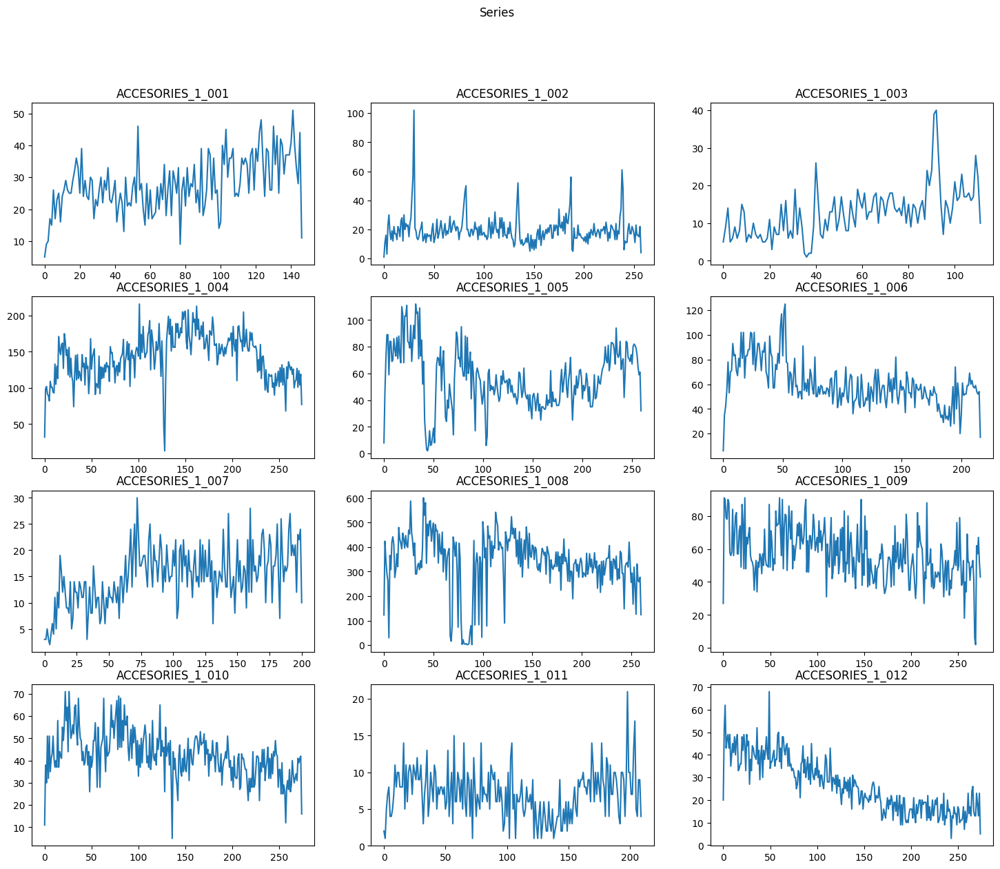

In [133]:
#Plot de algumas das séries temporais criadas 
fig, axs = plt.subplots(4,3,figsize=(18,14))
fig.suptitle('Series')
for i in range(4):
    for j in range(3):
        if i*4+j+1>len(seriesTemporais):
            continue
        axs[i, j].plot(seriesTemporais[i*3+j].values)
        axs[i, j].set_title(produtosSerie[i*3+j])
plt.show()

##### É interessante deixar todas as séries com a mesma distância temporal. Para tal, vamos verificar a maior série temporal para definir quantos pontos necessários precisamos e incluir valores nas séries que não possuem venda para os demais dias.

In [137]:
#Verificando a variedade de tamanho das séries criadas
series_lengths = {len(series) for series in seriesTemporais}
print(series_lengths)

{40, 47, 49, 50, 54, 56, 57, 59, 60, 62, 63, 64, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 

In [138]:
#Verificando a maior série
max_len = max(series_lengths)
longest_series = None
for series in seriesTemporais:
    if len(series) == max_len:
        longest_series = series

print(longest_series)

          units_sold
yearweek            
201104            31
201105            94
201106           103
201107            92
201108            78
...              ...
201613           129
201614           145
201615           146
201616           142
201653            50

[275 rows x 1 columns]


In [147]:
# Fazendo com que todas as séries possuam o mesmo tamanho porém com NaN.
problems_index = []

for i in range(len(seriesTemporais)):
    if len(seriesTemporais[i])!= max_len:
        problems_index.append(i)
        seriesTemporais[i] = seriesTemporais[i].reindex(longest_series.index)

In [148]:
# Validando as séries que possuem pelo menos 1 NaN 
### 2469
def nan_counter(list_of_series):
    nan_polluted_series_counter = 0
    for series in list_of_series:
        if series.isnull().sum().sum() > 0:
            nan_polluted_series_counter+=1
    print(nan_polluted_series_counter)
    
nan_counter(seriesTemporais)

0


In [149]:
# Realizando interpolação para incluir valores que façam sentido nos NaN
for i in problems_index:
    seriesTemporais[i].interpolate(limit_direction="both",inplace=True)

#Verificando que todos os NaN foram preenchidos
nan_counter(seriesTemporais)

0


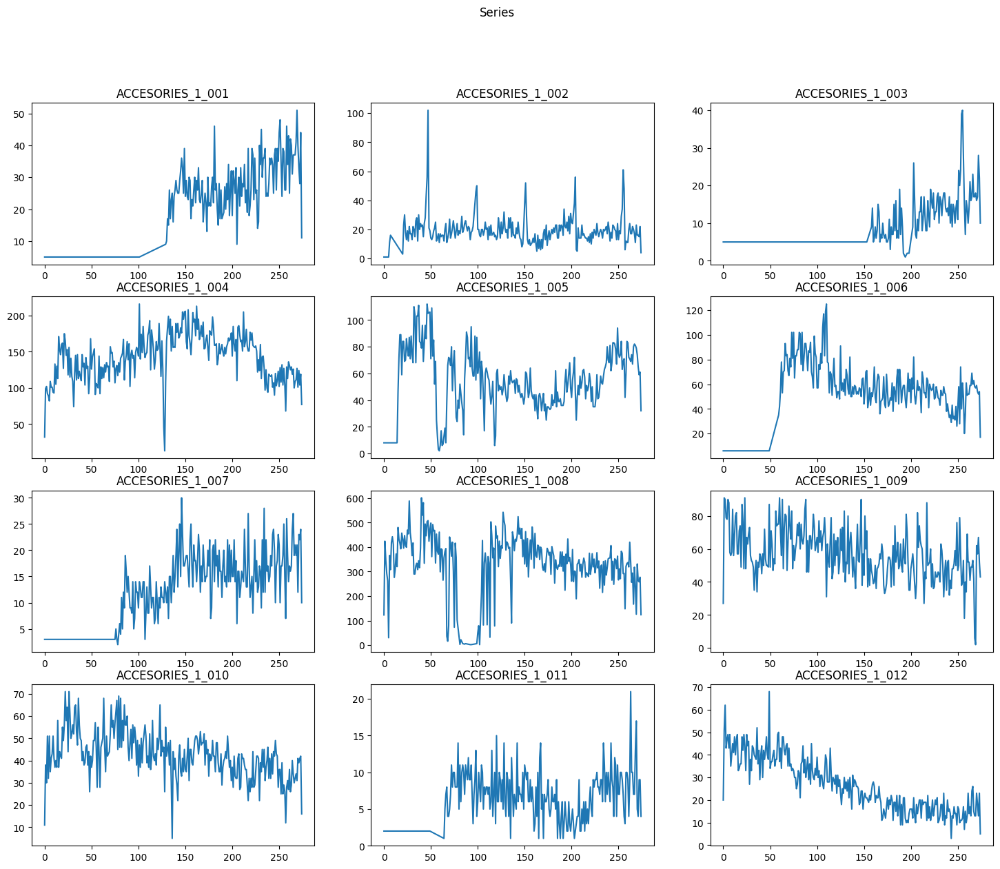

In [150]:
#Plotando as mesmas séries depois de fazer a interpolação
fig, axs = plt.subplots(4,3,figsize=(18,14))
fig.suptitle('Series')
for i in range(4):
    for j in range(3):
        if i*4+j+1>len(seriesTemporais):
            continue
        axs[i, j].plot(seriesTemporais[i*3+j].values)
        axs[i, j].set_title(produtosSerie[i*3+j])
plt.show()

##### Faz-se necessário realizar a normalização dos dados para que os valores atuais não sejam tão diferentes um dos outros (em escala), mesmo que tenham compotamento semelhante. 

In [151]:
# Normalização de cada série
for i in range(len(seriesTemporais)):
    scaler = MinMaxScaler()
    seriesTemporais[i] = MinMaxScaler().fit_transform(seriesTemporais[i])
    seriesTemporais[i]= seriesTemporais[i].reshape(len(seriesTemporais[i]))

In [152]:
# Range da normalização
print("max: "+str(max(seriesTemporais[0]))+"\tmin: "+str(min(seriesTemporais[0])))

max: 1.0	min: 0.0


#### Clustering

###### SOM (Self-organizing maps) é semelhante a uma neural network e utilizado para Unsupervised Learning. Busca reduzir a dimensionalidade e mantém a relação entre os dados, assim auxiliando na visualização e análise de dados complexos
https://github.com/JustGlowing/minisom

###### Parâmetros: 
 - Dimensão do Mapa (som_x, som_y)
 - Raio da vizinhaça dos neurônios (sigma)
 - Magnitude das atualizações dos pesos em cada iteração (learning_rate)
 - Quantidade de iterações

##### Grid Search com Iteration. Programa comentado porque demora muito mas já tem o resultado na última linha

In [167]:
# from sklearn.base import BaseEstimator, TransformerMixin
# from sklearn.model_selection import GridSearchCV
# import numpy as np

# class SOMWrapper(BaseEstimator, TransformerMixin):
#     def __init__(self, som_x=8, som_y=8, sigma=0.3, learning_rate=0.1, iterations=50000):
#         self.som_x = som_x
#         self.som_y = som_y
#         self.sigma = sigma
#         self.learning_rate = learning_rate
#         self.iterations = iterations

#     def fit(self, X, y=None):
#         self.som = MiniSom(self.som_x, self.som_y, X.shape[1], sigma=self.sigma, learning_rate=self.learning_rate)
#         self.som.random_weights_init(X)
#         self.som.train(X, self.iterations)
#         return self

#     def transform(self, X):
#         return np.array([self.som.winner(x) for x in X])

#     def score(self, X, y=None):
#         distances = np.array([np.linalg.norm(x - self.som._weights[self.som.winner(x)]) for x in X])
#         return -distances.mean()

# # Convertendo seriesTemporais para um array NumPy
# seriesTemporais = np.array(seriesTemporais)

# # Definindo os parâmetros para o grid search
# param_grid = {
#     'som_x': [3, 5, 8, 10],
#     'som_y': [3, 5, 8, 10],
#     'sigma': [0.1, 0.3, 0.5],
#     'learning_rate': [0.01, 0.1, 0.5],
#     'iterations': [10000, 50000, 100000]
# }

# # Criando o GridSearchCV
# grid_search = GridSearchCV(SOMWrapper(), param_grid, cv=3)

# # Executando o grid search
# grid_search.fit(seriesTemporais)

# # Melhor combinação de parâmetros
# print("Melhores parâmetros encontrados:", grid_search.best_params_)
# # Melhores parâmetros encontrados: {'iterations': 100000, 'learning_rate': 0.1, 'sigma': 0.5, 'som_x': 10, 'som_y': 10}

Melhores parâmetros encontrados: {'iterations': 100000, 'learning_rate': 0.1, 'sigma': 0.5, 'som_x': 10, 'som_y': 10}


In [168]:
## Aplicando o SOM
# Definindo o tamanho do mapa
som_x = som_y = 10

som = MiniSom(som_x, som_y, len(seriesTemporais[0]), sigma=0.5, learning_rate = 0.1)

som.random_weights_init(seriesTemporais)
som.train(seriesTemporais, 100000)

#### SOM - Valor Médio

In [171]:
# Cluster do SOM com valor médio em vermelho e cada plot das séries em cinza
def plot_som_series_averaged_center(som_x, som_y, win_map):
    fig, axs = plt.subplots(som_x,som_y,figsize=(50,50))
    fig.suptitle('Clusters')
    for x in range(som_x):
        for y in range(som_y):
            cluster = (x,y)
            if cluster in win_map.keys():
                for series in win_map[cluster]:
                    axs[cluster].plot(series,c="gray",alpha=0.5) 
                axs[cluster].plot(np.average(np.vstack(win_map[cluster]),axis=0),c="red")
            cluster_number = x*som_y+y+1
            axs[cluster].set_title(f"Cluster {cluster_number}")

    plt.show()

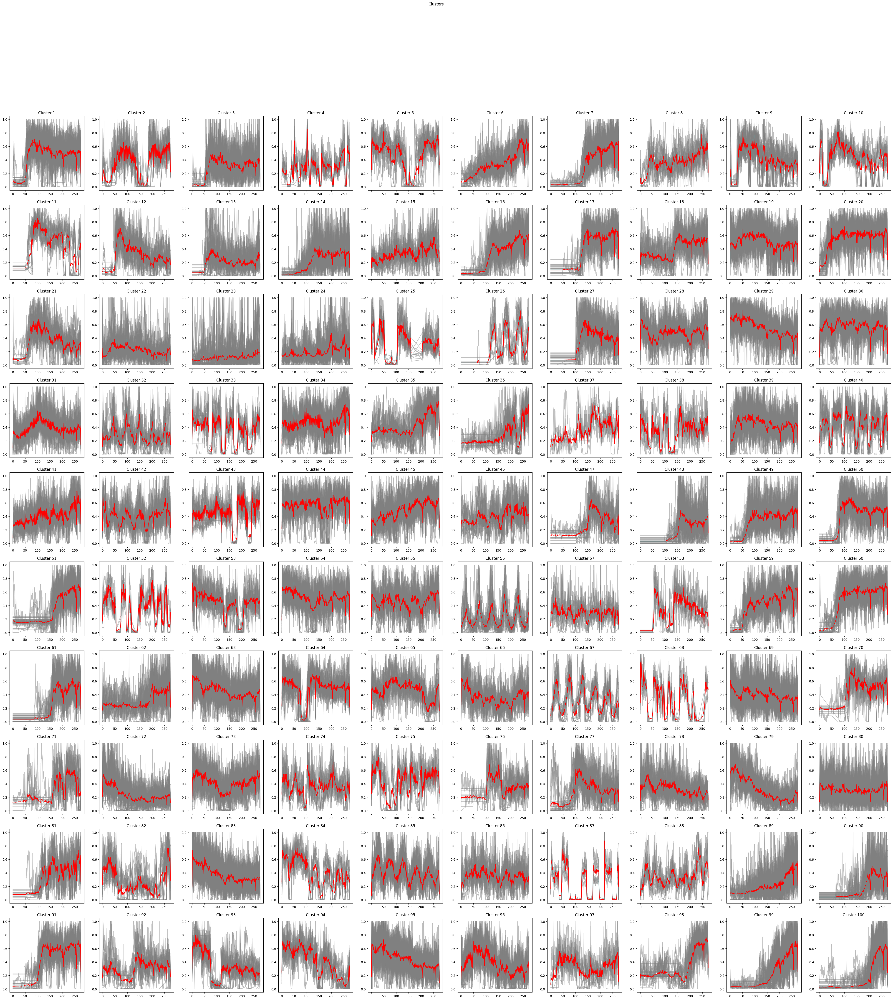

In [172]:
# Aplicando a função
win_map = som.win_map(seriesTemporais)
plot_som_series_averaged_center(som_x, som_y, win_map)

#### SOM - DTW/DBA

In [177]:
# Cluster do SOM com DTW em vermelho e cada plot das séries em cinza
def plot_som_series_dba_center(som_x, som_y, win_map):
    fig, axs = plt.subplots(som_x,som_y,figsize=(50,50))
    fig.suptitle('Clusters')
    for x in range(som_x):
        for y in range(som_y):
            cluster = (x,y)
            if cluster in win_map.keys():
                for series in win_map[cluster]:
                    axs[cluster].plot(series,c="gray",alpha=0.5) 
                axs[cluster].plot(dtw_barycenter_averaging(np.vstack(win_map[cluster])),c="red")
            cluster_number = x*som_y+y+1
            axs[cluster].set_title(f"Cluster {cluster_number}")

    plt.show()

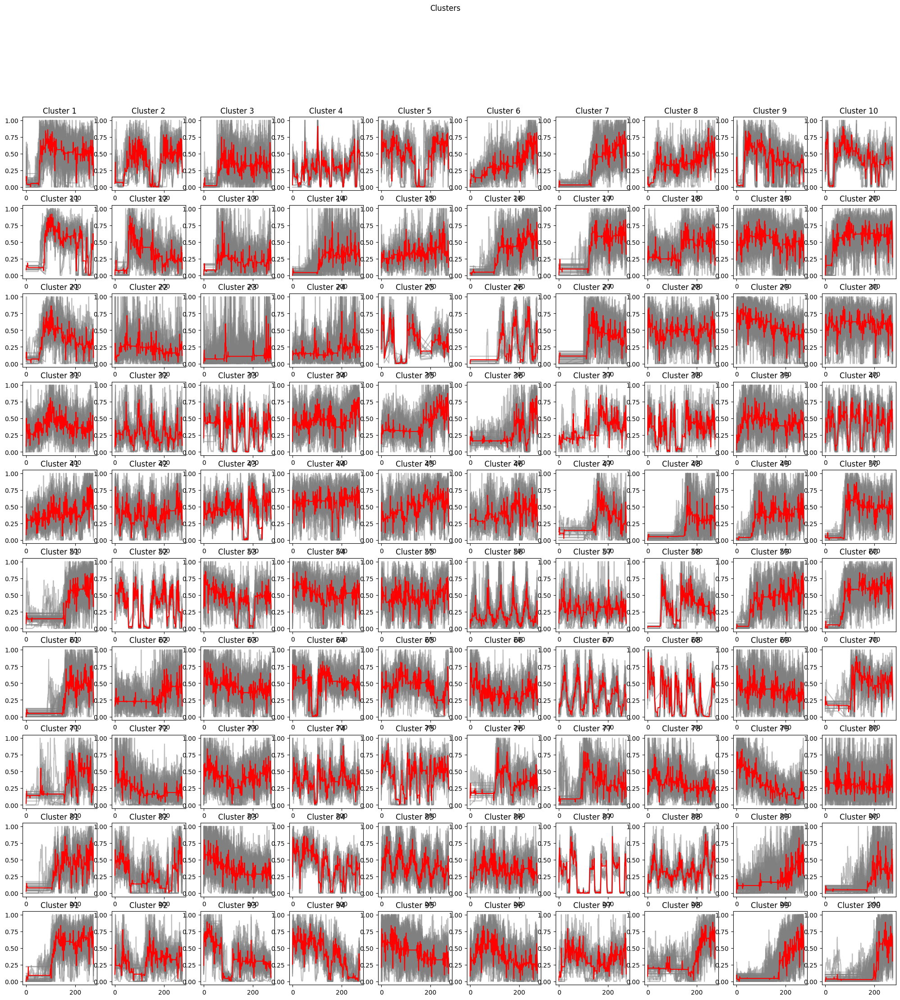

In [178]:
# Aplicando a função
win_map = som.win_map(seriesTemporais)
plot_som_series_dba_center(som_x, som_y, win_map)

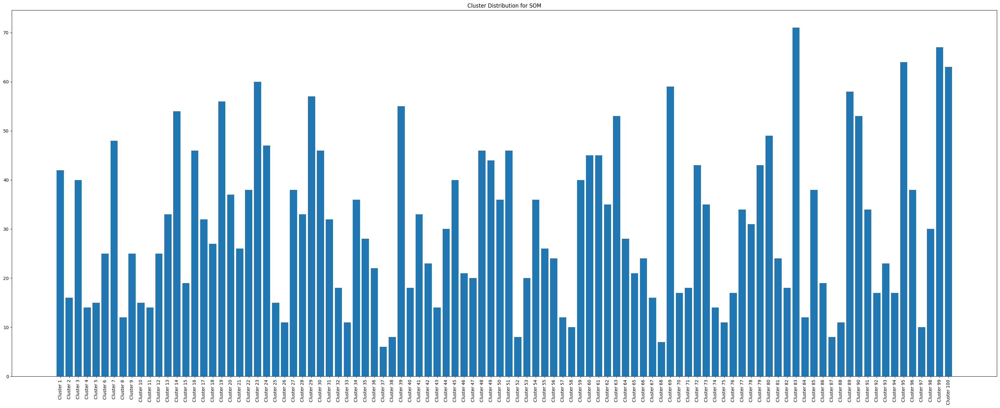

In [234]:
# Distribuição dos Cluster
cluster_c = []
cluster_n = []
for x in range(som_x):
    for y in range(som_y):
        cluster = (x,y)
        if cluster in win_map.keys():
            cluster_c.append(len(win_map[cluster]))
        else:
            cluster_c.append(0)
        cluster_number = x*som_y+y+1
        cluster_n.append(f"Cluster {cluster_number}")

plt.figure(figsize=(40,15))
plt.title("Cluster Distribution for SOM")
plt.bar(cluster_n,cluster_c)
plt.xticks(rotation='vertical')
plt.show()

In [180]:
# Criando Df com os produtos e seu cluster (É o mesmo. Talvez seja desenecessário)
cluster_map = []
for idx in range(len(seriesTemporais)):
    winner_node = som.winner(seriesTemporais[idx])
    cluster_map.append((produtosSerie[idx],f"Cluster {winner_node[0]*som_y+winner_node[1]+1}"))

df_clustered = pd.DataFrame(cluster_map,columns=["Series","Cluster"]).sort_values(by="Cluster").set_index("Series")
df_clustered

,Cluster
Series,
HOME_&_GARDEN_1_386,Cluster 1
HOME_&_GARDEN_1_241,Cluster 1
HOME_&_GARDEN_1_483,Cluster 1
HOME_&_GARDEN_1_232,Cluster 1
SUPERMARKET_1_186,Cluster 1
...,...
SUPERMARKET_3_262,Cluster 99
ACCESORIES_2_147,Cluster 99
SUPERMARKET_3_006,Cluster 99


In [181]:
# Verificando quantidade de produto por Cluster (DTW)
cluster_counts = df_clustered['Cluster'].value_counts()
print(cluster_counts)

Cluster
Cluster 83     71
Cluster 99     67
Cluster 95     64
Cluster 100    63
Cluster 23     60
               ..
Cluster 38      8
Cluster 87      8
Cluster 52      8
Cluster 68      7
Cluster 37      6
Name: count, Length: 100, dtype: int64
